# Using Controlnet as Pipeline

In [ ]:
import torch
import os
from huggingface_hub import HfApi
from pathlib import Path
from diffusers.utils import load_image
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

from diffusers import (
    ControlNetModel,
    StableDiffusionControlNetPipeline,
    UniPCMultistepScheduler,
)

from controlnet_aux import OpenposeDetector

device = "cuda" if torch.cuda.is_available() else "cpu"

model_id = 'stable-diffusion-v1-5/stable-diffusion-v1-5'
controlnet_id = "lllyasviel/control_v11p_sd15_openpose"

controlnet = ControlNetModel.from_pretrained(controlnet_id, torch_dtype=torch.float16)
pipeline = StableDiffusionControlNetPipeline.from_pretrained(
                                                            model_id, 
                                                            controlnet=controlnet,
                                                            safety_checker=None, 
                                                            torch_dtype=torch.float16
                                                               ).to(device)

pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)

pipeline.set_progress_bar_config(disable=True)

c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\triton\knobs.py:212: UserWarning: Failed to find cuobjdump.exe
  warnings.warn(f"Failed to find {binary}")
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\triton\knobs.py:212: UserWarning: Failed to find nvdisasm.exe
  warnings.warn(f"Failed to find {binary}")
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\controlnet_aux\mediapipe_face\mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\timm\models\layers\__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\timm\models\registry.py:4: 

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [2]:
ref_image = load_image(
    "luffy.png"
)

processor = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')
processor.to(device)


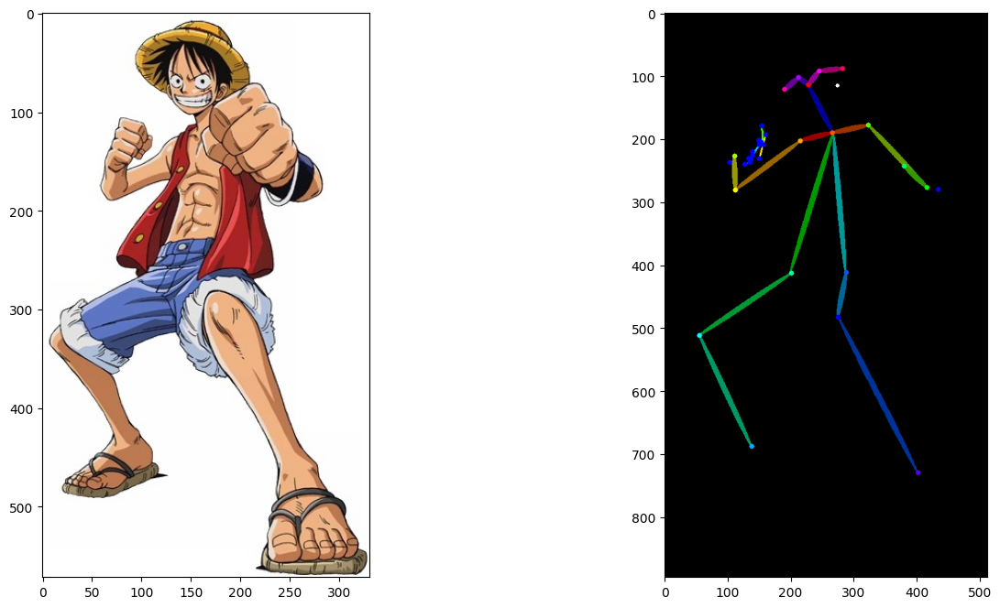

In [3]:
control_image = processor(ref_image, hand_and_face=True)

plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
plt.imshow(ref_image)
plt.subplot(1,2,2)
plt.imshow(control_image)
plt.show()

# Using different prompts

0it [00:00, ?it/s]

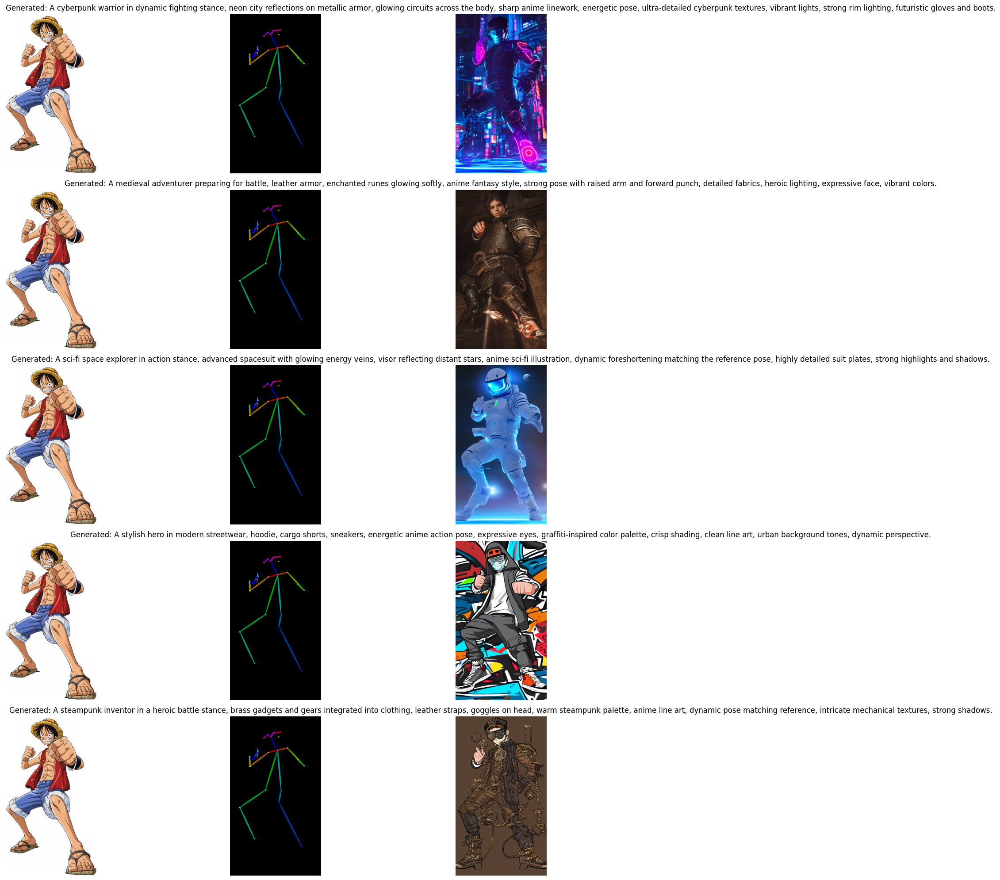

In [5]:
prompts = [
    "A cyberpunk warrior in dynamic fighting stance, neon city reflections on metallic armor, glowing circuits across the body, sharp anime linework, energetic pose, ultra-detailed cyberpunk textures, vibrant lights, strong rim lighting, futuristic gloves and boots.",

    "A medieval adventurer preparing for battle, leather armor, enchanted runes glowing softly, anime fantasy style, strong pose with raised arm and forward punch, detailed fabrics, heroic lighting, expressive face, vibrant colors.",

    "A sci-fi space explorer in action stance, advanced spacesuit with glowing energy veins, visor reflecting distant stars, anime sci-fi illustration, dynamic foreshortening matching the reference pose, highly detailed suit plates, strong highlights and shadows.",

    "A stylish hero in modern streetwear, hoodie, cargo shorts, sneakers, energetic anime action pose, expressive eyes, graffiti-inspired color palette, crisp shading, clean line art, urban background tones, dynamic perspective.",

    "A steampunk inventor in a heroic battle stance, brass gadgets and gears integrated into clothing, leather straps, goggles on head, warm steampunk palette, anime line art, dynamic pose matching reference, intricate mechanical textures, strong shadows."
]

fig, axes = plt.subplots(5, 3, figsize=(18, 20))

for idx, prompt in tqdm(enumerate(prompts)):
    gen_image = pipeline(prompt,
                      num_inference_steps=50, 
                      image=control_image,
                      generator=torch.manual_seed(33) 
                      ).images[0]
    
    axes[idx, 0].imshow(ref_image)
    axes[idx, 0].axis('off')
    
    axes[idx, 1].imshow(control_image)
    axes[idx, 1].axis('off')
    
    axes[idx, 2].imshow(gen_image)
    axes[idx, 2].set_title(f"Generated: {prompt}")
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()

# How to control the Controlnet Strength

0it [00:00, ?it/s]

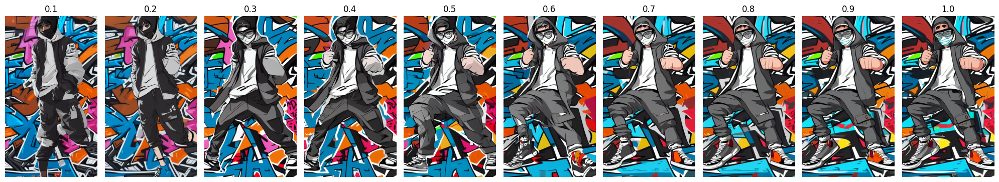

In [9]:
prompt =  "A stylish hero in modern streetwear, hoodie, cargo shorts, sneakers, energetic anime action pose, expressive eyes, graffiti-inspired color palette, crisp shading, clean line art, urban background tones, dynamic perspective."
    
fig, axes = plt.subplots(1, 10, figsize=(20, 10))

for idx, controlnet_scale in tqdm(enumerate([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])):
    gen_image = pipeline(prompt,
                      num_inference_steps=20, 
                      image=control_image,
                      controlnet_conditioning_scale=controlnet_scale,
                      generator=torch.manual_seed(33) 
                      ).images[0]
    
    axes[idx].imshow(gen_image)
    axes[idx].set_title(f"{controlnet_scale}")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

# Controlnet Inpainting

In [6]:

from diffusers import StableDiffusionControlNetInpaintPipeline

controlnet_inpaint_pipeline= StableDiffusionControlNetInpaintPipeline.from_pipe(pipeline)
controlnet_inpaint_pipeline.scheduler = UniPCMultistepScheduler.from_config(controlnet_inpaint_pipeline.scheduler.config)

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet_inpaint.StableDiffusionControlNetInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


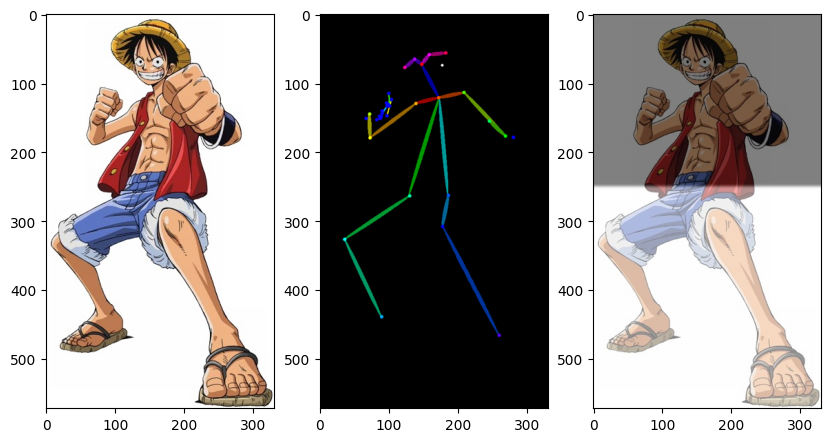

In [18]:
from scipy.ndimage import gaussian_filter
ref_image = load_image(
    "luffy.png"
)

# Controlnet image creation
# control_image = processor(ref_image, hand_and_face=True)

# Mask creation
mask = np.zeros((ref_image.height,ref_image.width), dtype=np.float32)
mask[250:, :] = 1.0
mask = gaussian_filter(mask, sigma=2)
mask=Image.fromarray((mask * 255).astype(np.uint8))

plt.figure(figsize=(10,6))
plt.subplot(1,3,1)
plt.imshow(ref_image)
plt.subplot(1,3,2)
plt.imshow(control_image.resize(ref_image.size))
plt.subplot(1,3,3)
plt.imshow(ref_image)
plt.imshow(mask,cmap='gray',alpha=0.5)
plt.show()


  0%|          | 0/20 [00:00<?, ?it/s]

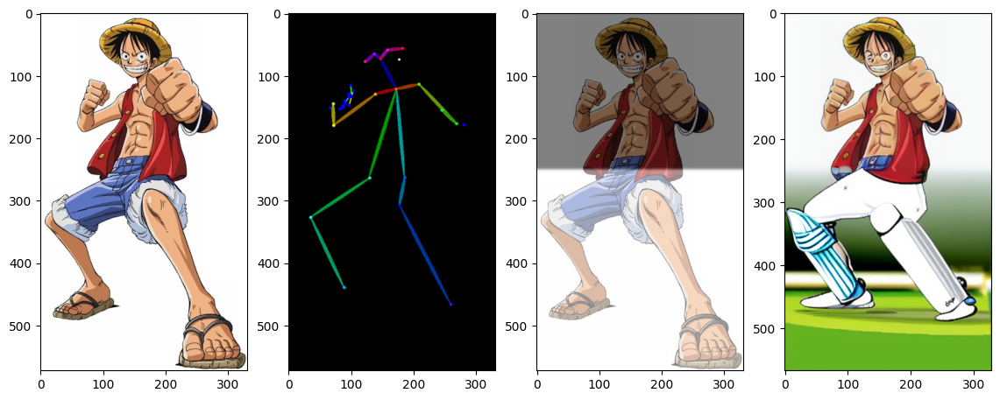

In [22]:
prompt =  "cricket player with pads"

gen_image = controlnet_inpaint_pipeline(
    prompt,
    num_inference_steps=20, 
    image=ref_image,
    mask_image=mask,
    control_image=control_image.resize(ref_image.size),
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(33) 
).images[0]

plt.figure(figsize=(14,6))
plt.subplot(1,4,1)
plt.imshow(ref_image)
plt.subplot(1,4,2)
plt.imshow(control_image.resize(ref_image.size))
plt.subplot(1,4,3)
plt.imshow(ref_image)
plt.imshow(mask,cmap='gray',alpha=0.5)
plt.subplot(1,4,4)
plt.imshow(gen_image)
plt.show()

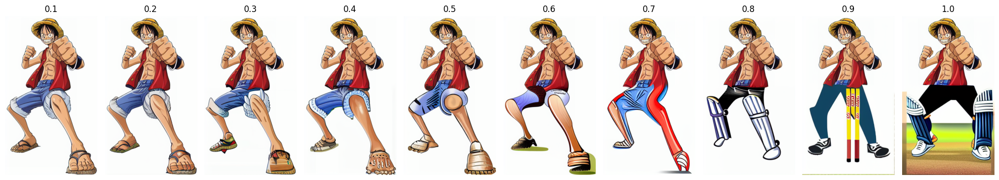

In [23]:
controlnet_inpaint_pipeline.set_progress_bar_config(disable=True)

prompt =  "cricket player with pads"
    

fig, axes = plt.subplots(1, 10, figsize=(20, 5))

for idx, strength in enumerate([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]):
    gen_image = controlnet_inpaint_pipeline(
                                                prompt,
                                                num_inference_steps=20, 
                                                image=ref_image,
                                                mask_image=mask,
                                                strength=strength,
                                                control_image=control_image.resize(ref_image.size)
                                            ).images[0]

    
    axes[idx].imshow(gen_image)
    axes[idx].set_title(f"{strength}")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

# Combining Multiple Controlnets

In [1]:
import torch
import os
from huggingface_hub import HfApi
from pathlib import Path
from diffusers.utils import load_image
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

from diffusers import (
    ControlNetModel,
    StableDiffusionControlNetPipeline,
    UniPCMultistepScheduler,
)

from controlnet_aux import OpenposeDetector

device = "cuda" if torch.cuda.is_available() else "cpu"

model_id = 'stable-diffusion-v1-5/stable-diffusion-v1-5'

pose_controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_openpose", torch_dtype=torch.float16)
depth_controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11f1p_sd15_depth", torch_dtype=torch.float16)


pipeline = StableDiffusionControlNetPipeline.from_pretrained(
                                                            model_id, 
                                                            controlnet=[pose_controlnet,depth_controlnet],
                                                            safety_checker=None, 
                                                            torch_dtype=torch.float16
                                                               ).to(device)

pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)
pipeline.set_progress_bar_config(disable=True)

c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\triton\knobs.py:212: UserWarning: Failed to find cuobjdump.exe
  warnings.warn(f"Failed to find {binary}")
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\triton\knobs.py:212: UserWarning: Failed to find nvdisasm.exe
  warnings.warn(f"Failed to find {binary}")
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\controlnet_aux\mediapipe_face\mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\timm\models\layers\__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
c:\Users\User\miniconda3\envs\torch_env\lib\site-packages\timm\models\registry.py:4: 

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


## Controlnet Images

In [2]:
import transformers
depth_estimator = transformers.pipeline('depth-estimation')
processor = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')
processor.to(device)

No model was supplied, defaulted to Intel/dpt-large and revision bc15f29 (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a 

In [3]:
ref_image = load_image('luffy.png')
image = depth_estimator(ref_image)['depth']
image = np.array(image)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
depth_control_image = Image.fromarray(image).resize((512,786))

In [4]:
pose_control_image = processor(ref_image, hand_and_face=True).resize((512,786))

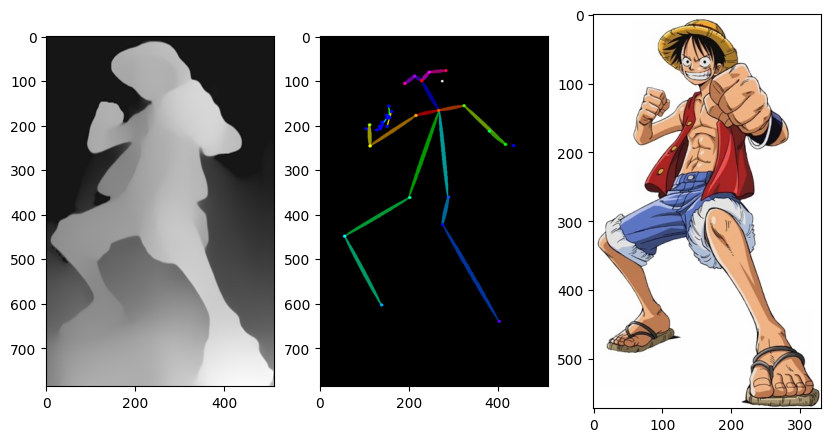

In [5]:
plt.figure(figsize=(10,6))
plt.subplot(1,3,1)
plt.imshow(depth_control_image)
plt.subplot(1,3,2)
plt.imshow(pose_control_image)
plt.subplot(1,3,3)
plt.imshow(ref_image)
plt.show()

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

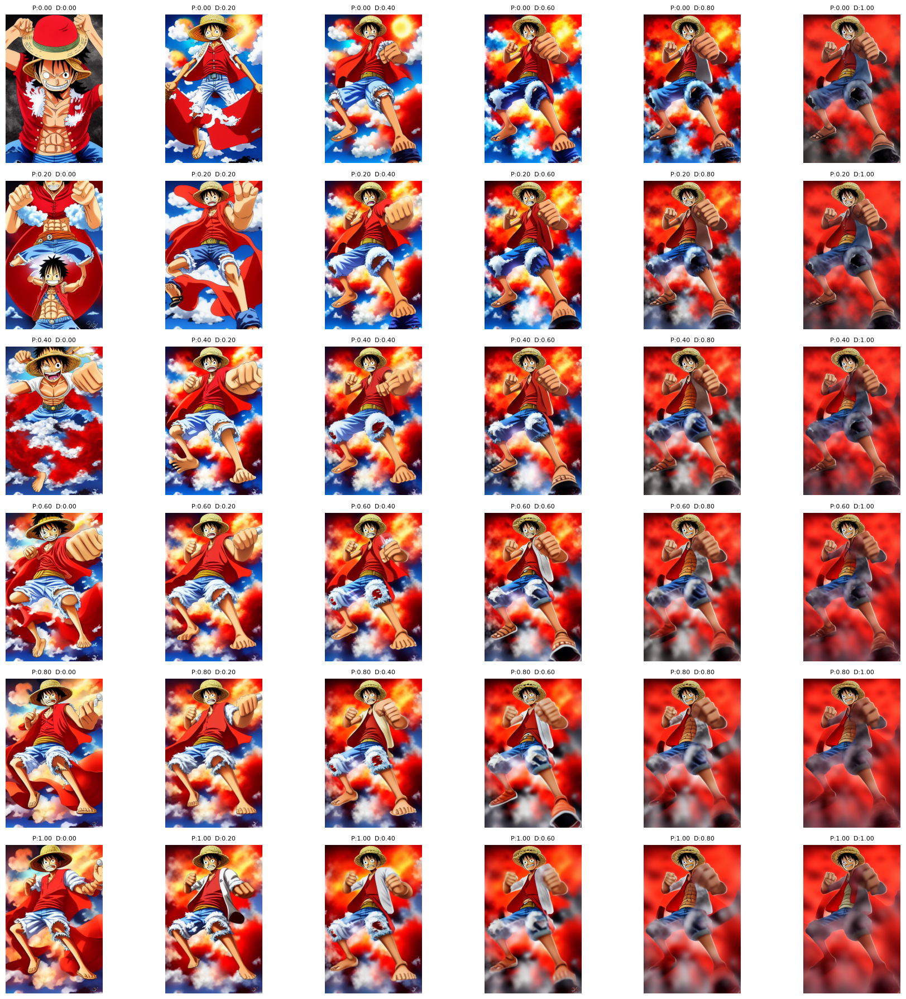

In [ ]:
prompt = """
luffy. red shirt, straw hat, anime, boy
"""
negative_prompt = "lowres, bad anatomy, worst quality, low quality, deformed, ugly"

images = [pose_control_image, depth_control_image]

# Sweep settings
steps = 6                                   # size of the grid
scales = np.linspace(0.0, 1.0, steps)        # 0.0 → 1.0

# Prepare figure
fig, axes = plt.subplots(steps, steps, figsize=(steps * 3, steps * 3))

for i, s1 in tqdm(enumerate(scales)):             # pose control
    for j, s2 in enumerate(scales):         # depth control

        gen_image = pipeline(
            prompt,
            negative_prompt=negative_prompt,
            image=images,
            num_inference_steps=20,
            controlnet_conditioning_scale=[s1, s2],
            generator=torch.manual_seed(777),
        ).images[0]

        axes[i, j].imshow(gen_image)
        axes[i, j].axis("off")
        axes[i, j].set_title(f"P:{s1:.2f}  D:{s2:.2f}", fontsize=8)

plt.tight_layout()
plt.show()